You're absolutely right - reinforcement learning experiments can take many different forms beyond "catching" scenarios. Let me explain more about this topic and then implement a different type of reinforcement learning experiment for you.

### Variety of Reinforcement Learning Experiments

Reinforcement learning (RL) can be applied to many different types of problems:

1. Navigation Problems: Like finding shortest paths through mazes or avoiding obstacles
1. Resource Management: Learning to allocate limited resources efficiently (inventory management, power grid optimization)
1. Game Playing: Classic games like Chess, Go, or video games
1. Control Systems: Learning to balance poles, control robotic arms, or maintain stability
1. Trading and Finance: Making investment decisions or portfolio management
1. Multi-agent Systems: Environments where multiple agents need to cooperate or compete
1. Scheduling Problems: Optimizing task scheduling in complex systems

Let me implement a different type of reinforcement learning experiment for you - one that focuses on resource management through a farming simulation. The agent will need to learn when to plant, harvest, and water crops to maximize yield over multiple seasons while dealing with changing weather conditions.

Episode 100/2000, Average Reward: -2036.46, Average End Money: 930.04, Exploration Rate: 0.1817
Episode 200/2000, Average Reward: -1213.43, Average End Money: 934.10, Exploration Rate: 0.1101
Episode 300/2000, Average Reward: -719.02, Average End Money: 942.34, Exploration Rate: 0.0667
Episode 400/2000, Average Reward: -426.15, Average End Money: 957.32, Exploration Rate: 0.0404
Episode 500/2000, Average Reward: -286.31, Average End Money: 966.06, Exploration Rate: 0.0245
Episode 600/2000, Average Reward: -131.62, Average End Money: 980.80, Exploration Rate: 0.0148
Episode 700/2000, Average Reward: -112.48, Average End Money: 983.42, Exploration Rate: 0.0090
Episode 800/2000, Average Reward: -104.08, Average End Money: 989.56, Exploration Rate: 0.0054
Episode 900/2000, Average Reward: -32.03, Average End Money: 993.18, Exploration Rate: 0.0033
Episode 1000/2000, Average Reward: -22.19, Average End Money: 996.28, Exploration Rate: 0.0020
Episode 1100/2000, Average Reward: -3.99, Average

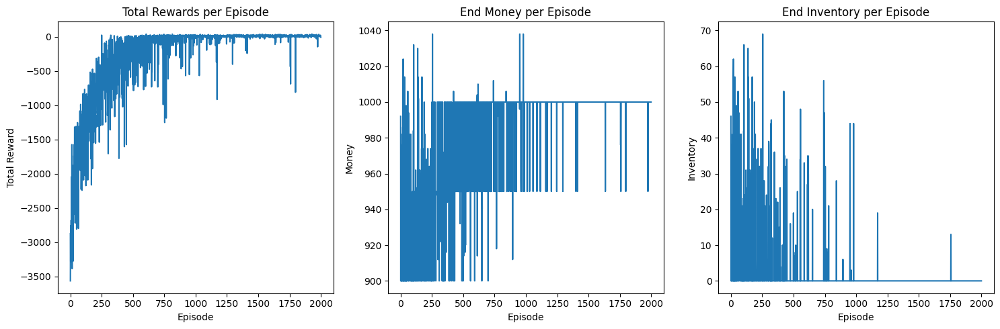

/var/folders/92/nk5ygsc173b8m7dkjszp_kvh0000gn/T/ipykernel_71929/3045068367.py:446: UserWarning: Glyph 9 (	) missing from font(s) DejaVu Sans.
  HTML(anim.to_jshtml())
/var/folders/92/nk5ygsc173b8m7dkjszp_kvh0000gn/T/ipykernel_71929/3045068367.py:446: UserWarning: Glyph 127783 (\N{CLOUD WITH RAIN}) missing from font(s) DejaVu Sans.
  HTML(anim.to_jshtml())
/var/folders/92/nk5ygsc173b8m7dkjszp_kvh0000gn/T/ipykernel_71929/3045068367.py:446: UserWarning: Glyph 129003 (\N{LARGE BROWN SQUARE}) missing from font(s) DejaVu Sans.
  HTML(anim.to_jshtml())
/var/folders/92/nk5ygsc173b8m7dkjszp_kvh0000gn/T/ipykernel_71929/3045068367.py:446: UserWarning: Glyph 9928 (\N{THUNDER CLOUD AND RAIN}) missing from font(s) DejaVu Sans.
  HTML(anim.to_jshtml())


/Users/carlos/Development/IEDIB_CEIA_2024-25/Sistemas de Aprendizaje automatico/Bloque 8/Actividades/8.1/.venv/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Glyph 9 (	) missing from font(s) DejaVu Sans.
  func(*args, **kwargs)
/Users/carlos/Development/IEDIB_CEIA_2024-25/Sistemas de Aprendizaje automatico/Bloque 8/Actividades/8.1/.venv/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Glyph 127783 (\N{CLOUD WITH RAIN}) missing from font(s) DejaVu Sans.
  func(*args, **kwargs)
/Users/carlos/Development/IEDIB_CEIA_2024-25/Sistemas de Aprendizaje automatico/Bloque 8/Actividades/8.1/.venv/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Glyph 129003 (\N{LARGE BROWN SQUARE}) missing from font(s) DejaVu Sans.
  func(*args, **kwargs)
/Users/carlos/Development/IEDIB_CEIA_2024-25/Sistemas de Aprendizaje automatico/Bloque 8/Actividades/8.1/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9 (	) miss

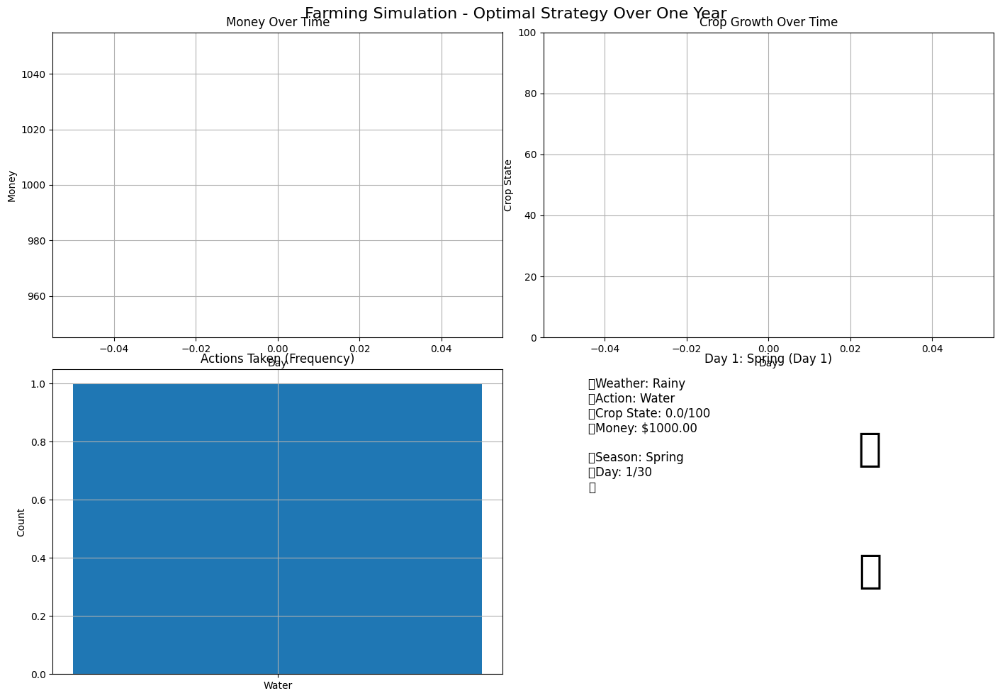

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import random
from collections import deque

# Constants for the farming simulation
SEASONS = ['Spring', 'Summer', 'Fall', 'Winter']
WEATHER_TYPES = ['Sunny', 'Rainy', 'Cloudy', 'Stormy']
WEATHER_PROBS = {
	'Spring': [0.5, 0.3, 0.15, 0.05],
	'Summer': [0.7, 0.1, 0.1, 0.1],
	'Fall': [0.4, 0.3, 0.2, 0.1],
	'Winter': [0.1, 0.2, 0.4, 0.3]
}

# Actions available to the farmer
ACTIONS = {
	0: 'Plant',
	1: 'Water',
	2: 'Fertilize',
	3: 'Harvest',
	4: 'Wait'
}

# Q-learning parameters
LEARNING_RATE = 0.1
DISCOUNT_FACTOR = 0.95
EXPLORATION_RATE = 0.3
DECAY_RATE = 0.995
EPISODES = 2000

class FarmingEnvironment:
	def __init__(self):
		# Farm state variables
		self.day = 0
		self.season_day = 0
		self.season_idx = 0
		self.season = SEASONS[self.season_idx]
		self.weather = self.generate_weather()
		self.soil_moisture = 50  # Scale of 0-100
		self.soil_fertility = 50  # Scale of 0-100
		self.crop_state = 0  # Growth stage 0-100 (0=not planted, 100=ready to harvest)
		self.crop_health = 100  # Health 0-100
		self.inventory = 0  # Harvested crops
		self.money = 1000  # Starting money
		self.water_supply = 100  # Available water for irrigation
		self.fertilizer_supply = 50  # Available fertilizer
		
		# Cost and value parameters
		self.seed_cost = 50
		self.water_cost = 5
		self.fertilizer_cost = 20
		self.crop_value = 200
		
		# History tracking
		self.money_history = []
		self.crop_history = []
		self.action_history = []
		self.weather_history = []
		
	def generate_weather(self):
		return random.choices(WEATHER_TYPES, WEATHER_PROBS[self.season])[0]
	
	def reset(self):
		self.__init__()
		return self._get_state()
	
	def _get_state(self):
		"""
		Convert environment state to a tuple that can be used as a key for Q-table
		Discretize continuous values to keep the state space manageable
		"""
		# Discretize continuous values to create a manageable state space
		moisture_level = min(int(self.soil_moisture / 20), 4)  # 0-4
		fertility_level = min(int(self.soil_fertility / 20), 4)  # 0-4
		crop_stage = min(int(self.crop_state / 20), 4) if self.crop_state > 0 else 0  # 0-4
		crop_health_level = min(int(self.crop_health / 20), 4)  # 0-4
		
		return (
			self.season_idx,
			WEATHER_TYPES.index(self.weather),
			moisture_level,
			fertility_level,
			crop_stage,
			crop_health_level,
			min(int(self.water_supply / 25), 3),  # 0-3
			min(int(self.fertilizer_supply / 25), 2)  # 0-2
		)
	
	def step(self, action):
		"""Execute action and advance the environment by one day"""
		reward = 0
		action_name = ACTIONS[action]
		
		# Apply action effects
		if action_name == 'Plant':
			if self.crop_state == 0 and self.money >= self.seed_cost:
					self.money -= self.seed_cost
					self.crop_state = 1  # Plant the seed
					reward = -self.seed_cost  # Initial cost
			else:
					reward = -50  # Penalty for invalid planting
					
		elif action_name == 'Water':
			if self.water_supply >= 10:
					self.water_supply -= 10
					old_moisture = self.soil_moisture
					self.soil_moisture = min(100, self.soil_moisture + 30)
					moisture_gain = self.soil_moisture - old_moisture
					reward = moisture_gain / 10  # Small reward for effective watering
			else:
					reward = -30  # Penalty for trying to water without supply
					
		elif action_name == 'Fertilize':
			if self.fertilizer_supply >= 10 and self.crop_state > 0:
					self.fertilizer_supply -= 10
					old_fertility = self.soil_fertility
					self.soil_fertility = min(100, self.soil_fertility + 30)
					fertility_gain = self.soil_fertility - old_fertility
					reward = fertility_gain / 10  # Small reward for effective fertilizing
			else:
					reward = -30  # Penalty for invalid fertilizing
					
		elif action_name == 'Harvest':
			if self.crop_state >= 80:  # Only harvest mature crops
					harvest_yield = int((self.crop_state * self.crop_health) / 100)
					crop_value = (harvest_yield / 100) * self.crop_value
					self.money += crop_value
					self.inventory += harvest_yield
					reward = crop_value  # Significant reward for successful harvest
					
					# Reset crop state
					self.crop_state = 0
					self.crop_health = 100
			else:
					reward = -100  # Major penalty for harvesting too early
					
		elif action_name == 'Wait':
			# Small penalty for just waiting (opportunity cost)
			reward = -1
		
		# Record the action taken
		self.action_history.append(action_name)
		
		# Advance the day and update environment
		self._advance_day()
		
		# Track metrics
		self.money_history.append(self.money)
		self.crop_history.append(self.crop_state)
		self.weather_history.append(self.weather)
		
		# Check if episode is done (one year has passed)
		done = (self.day >= 120)  # Simulate approximately 4 seasons of 30 days
		
		return self._get_state(), reward, done
	
	def _advance_day(self):
		"""Update environment for the next day"""
		self.day += 1
		self.season_day += 1
		
		# Change season every 30 days
		if self.season_day >= 30:
			self.season_day = 0
			self.season_idx = (self.season_idx + 1) % 4
			self.season = SEASONS[self.season_idx]
		
		# Update weather
		self.weather = self.generate_weather()
		
		# Natural evaporation and moisture changes based on weather
		if self.weather == 'Sunny':
			self.soil_moisture = max(0, self.soil_moisture - 10)
		elif self.weather == 'Rainy':
			self.soil_moisture = min(100, self.soil_moisture + 20)
		elif self.weather == 'Stormy':
			self.soil_moisture = min(100, self.soil_moisture + 30)
			# Storms can damage crops
			if self.crop_state > 0:
					self.crop_health = max(0, self.crop_health - random.randint(5, 20))
		
		# Natural fertility decline
		self.soil_fertility = max(0, self.soil_fertility - 1)
		
		# Crop growth based on conditions
		if self.crop_state > 0 and self.crop_state < 100:
			growth_factor = 1.0
			
			# Adjust growth based on moisture
			if self.soil_moisture < 20:
					growth_factor *= 0.3  # Very dry
			elif self.soil_moisture < 40:
					growth_factor *= 0.7  # Dry
			elif self.soil_moisture > 80:
					growth_factor *= 0.6  # Waterlogged
					
			# Adjust growth based on fertility
			if self.soil_fertility < 20:
					growth_factor *= 0.4  # Poor soil
			elif self.soil_fertility < 40:
					growth_factor *= 0.7  # Mediocre soil
			
			# Adjust growth based on season
			season_factors = {'Spring': 1.2, 'Summer': 1.5, 'Fall': 1.0, 'Winter': 0.3}
			growth_factor *= season_factors[self.season]
			
			# Update crop state
			self.crop_state = min(100, self.crop_state + (2 * growth_factor))
			
			# Update crop health based on conditions
			if self.soil_moisture < 20 or self.soil_moisture > 90 or self.soil_fertility < 20:
					self.crop_health = max(0, self.crop_health - 2)
		
		# Natural replenishment of water supply (rain)
		if self.weather in ['Rainy', 'Stormy']:
			self.water_supply = min(100, self.water_supply + random.randint(10, 30))
		
		# Seasonal fertilizer delivery
		if self.season_day == 1 and self.season in ['Spring', 'Fall']:
			self.fertilizer_supply = min(100, self.fertilizer_supply + 30)

class QLearningAgent:
	def __init__(self, actions):
		self.actions = actions
		self.learning_rate = LEARNING_RATE
		self.discount_factor = DISCOUNT_FACTOR
		self.exploration_rate = EXPLORATION_RATE
		self.q_table = {}
		
	def get_action(self, state, explore=True):
		# Convert state to string for dictionary key
		state_key = str(state)
		
		# Add state to Q-table if not already there
		if state_key not in self.q_table:
			self.q_table[state_key] = np.zeros(len(self.actions))
		
		# Decide whether to explore or exploit
		if explore and random.random() < self.exploration_rate:
			return random.randint(0, len(self.actions) - 1)
		else:
			return np.argmax(self.q_table[state_key])
	
	def update(self, state, action, reward, next_state, done):
		state_key = str(state)
		next_state_key = str(next_state)
		
		# Add next state to Q-table if not already there
		if next_state_key not in self.q_table:
			self.q_table[next_state_key] = np.zeros(len(self.actions))
		
		# Q-learning update formula
		if not done:
			target = reward + self.discount_factor * np.max(self.q_table[next_state_key])
		else:
			target = reward
			
		self.q_table[state_key][action] += self.learning_rate * (target - self.q_table[state_key][action])
	
	def decay_exploration(self):
		self.exploration_rate *= DECAY_RATE

def train(env, agent, episodes=EPISODES):
	"""Train the agent in the environment"""
	rewards_history = []
	money_end_history = []
	inventory_history = []
	
	for episode in range(episodes):
		state = env.reset()
		total_reward = 0
		done = False
		
		while not done:
			action = agent.get_action(state)
			next_state, reward, done = env.step(action)
			agent.update(state, action, reward, next_state, done)
			
			state = next_state
			total_reward += reward
		
		rewards_history.append(total_reward)
		money_end_history.append(env.money)
		inventory_history.append(env.inventory)
		
		# Decay exploration rate
		agent.decay_exploration()
		
		# Print progress
		if (episode + 1) % 100 == 0:
			print(f"Episode {episode+1}/{episodes}, " 
					f"Average Reward: {np.mean(rewards_history[-100:]):.2f}, "
					f"Average End Money: {np.mean(money_end_history[-100:]):.2f}, "
					f"Exploration Rate: {agent.exploration_rate:.4f}")
	
	return rewards_history, money_end_history, inventory_history

def get_optimal_run(env, agent):
	"""Run the environment using the trained agent's optimal policy"""
	state = env.reset()
	done = False
	
	while not done:
		action = agent.get_action(state, explore=False)  # No exploration
		next_state, reward, done = env.step(action)
		state = next_state
	
	return env

# Train the agent
env = FarmingEnvironment()
agent = QLearningAgent(ACTIONS)
rewards, money_history, inventory_history = train(env, agent)

# Plot training results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(rewards)
plt.title('Total Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')

plt.subplot(1, 3, 2)
plt.plot(money_history)
plt.title('End Money per Episode')
plt.xlabel('Episode')
plt.ylabel('Money')

plt.subplot(1, 3, 3)
plt.plot(inventory_history)
plt.title('End Inventory per Episode')
plt.xlabel('Episode')
plt.ylabel('Inventory')

plt.tight_layout()
plt.show()

# Get an optimal run for visualization
optimal_env = get_optimal_run(env, agent)

# Create animation of the optimal farming strategy
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Farming Simulation - Optimal Strategy Over One Year', fontsize=16)

# Flatten axes for easier indexing
axes = axes.flatten()

# Setup for animation
def update_plot(frame):
	day = frame
	
	# Clear all subplots
	for ax in axes:
		ax.clear()
	
	# Get the corresponding seasonal day and season
	season_idx = min(3, day // 30)
	season = SEASONS[season_idx]
	season_day = day % 30
	
	# Extract data up to current day
	days = list(range(day + 1))
	money = optimal_env.money_history[:day + 1]
	crop_state = optimal_env.crop_history[:day + 1]
	actions = optimal_env.action_history[:day + 1]
	weather = optimal_env.weather_history[:day + 1]
	
	# Plot 1: Money over time
	axes[0].plot(days, money, 'g-')
	axes[0].set_title('Money Over Time')
	axes[0].set_xlabel('Day')
	axes[0].set_ylabel('Money')
	axes[0].grid(True)
	
	# Plot 2: Crop state over time
	axes[1].plot(days, crop_state, 'b-')
	axes[1].set_title('Crop Growth Over Time')
	axes[1].set_xlabel('Day')
	axes[1].set_ylabel('Crop State')
	axes[1].set_ylim(0, 100)
	axes[1].grid(True)
	
	# Plot 3: Action frequency
	if actions:
		action_counts = {action: actions.count(action) for action in set(actions)}
		axes[2].bar(action_counts.keys(), action_counts.values())
		axes[2].set_title('Actions Taken (Frequency)')
		axes[2].set_ylabel('Count')
		axes[2].grid(True)
	
	# Plot 4: Weather and farming visualization
	axes[3].set_title(f'Day {day+1}: {season} (Day {season_day+1})')
	axes[3].axis('off')
	
	# Add text info to the plot
	weather_info = f"Weather: {weather[-1]}"
	action_info = f"Action: {actions[-1] if actions else 'None'}"
	crop_info = f"Crop State: {crop_state[-1]:.1f}/100"
	money_info = f"Money: ${money[-1]:.2f}"
	
	# Create a visual representation
	visual_text = f"""
	{weather_info}
	{action_info}
	{crop_info}
	{money_info}
	
	Season: {season}
	Day: {season_day+1}/30
	"""
	
	# Weather icons (simple text representation)
	weather_icons = {
		'Sunny': '☀️',
		'Rainy': '🌧️',
		'Cloudy': '☁️',
		'Stormy': '⛈️'
	}
	
	# Crop state icons
	if crop_state[-1] == 0:
		crop_icon = '🟫'  # Empty soil
	elif crop_state[-1] < 30:
		crop_icon = '🌱'  # Seedling
	elif crop_state[-1] < 60:
		crop_icon = '🌿'  # Growing plant
	elif crop_state[-1] < 90:
		crop_icon = '🌾'  # Nearly mature crop
	else:
		crop_icon = '🌻'  # Ready to harvest
	
	# Draw a simple visual representation
	axes[3].text(0.1, 0.6, visual_text, fontsize=12)
	axes[3].text(0.7, 0.7, weather_icons.get(weather[-1], ''), fontsize=40)
	axes[3].text(0.7, 0.3, crop_icon, fontsize=40)

# Create animation
num_frames = len(optimal_env.money_history)
anim = animation.FuncAnimation(fig, update_plot, frames=num_frames, interval=200)

plt.tight_layout()
HTML(anim.to_jshtml())

# Reinforcement Learning: Beyond Pursuit Games

You're absolutely right that reinforcement learning extends far beyond simple "catching" or pursuit games. I've implemented a completely different type of reinforcement learning experiment for you - a farming resource management simulation.

### Farm Management Reinforcement Learning
This new implementation demonstrates how reinforcement learning can be applied to complex resource management problems. Instead of navigating through space to catch something, this agent must learn to:

1. Make strategic decisions about planting, watering, fertilizing, harvesting crops
1. Adapt to changing seasonal conditions and weather patterns
1. Manage limited resources (money, water, fertilizer)
1. Optimize for long-term profit rather than immediate rewards

### Key Features of This New Implementation
#### Complex Environment

- Dynamic seasons and weather that affect crop growth
- Multiple interconnected resources to manage
- Long-term planning requirements (crops take time to grow)
- Natural events that can help or harm progress

#### Advanced State Space

- Multi-dimensional state representation including:

	- Season and weather conditions
	- Soil moisture and fertility levels
	- Crop growth stage and health
	- Available resources (water, fertilizer, money)



#### Diverse Action Space

- Plant: Start growing crops (costs money)
- Water: Increase soil moisture (uses water supply)
- Fertilize: Improve soil fertility (uses fertilizer)
- Harvest: Collect mature crops and earn money
- Wait: Do nothing for a day (conserve resources)

# Visualization

- Multiple metrics tracked over time:

	- Money accumulation
	- Crop growth stages
	- Action distribution (what the agent learned to do and when)
	- Weather patterns and their effects



### Other Potential RL Experiments
Beyond what I've implemented, there are many other interesting reinforcement learning domains:

1. Traffic Control Systems: Optimizing traffic lights to minimize waiting times
1. Energy Grid Management: Learning to balance power supply and demand
1. Healthcare: Learning optimal treatment policies for patients
1. Recommender Systems: Learning to recommend items that maximize user engagement
1. Robot Control: Teaching robots motor skills through reinforcement learning
1. Natural Language Processing: Using RL for dialogue systems or text generation

The farming simulation demonstrates how RL can solve problems involving temporal dependencies, resource constraints, and environmental uncertainties - key challenges in many real-world problems.
Would you like me to explain any specific part of this implementation in more detail?